# Processing

## Configuration

In [60]:
import os
import re
import cv2
import numpy as np
import pandas as pd
from collections import defaultdict
from tqdm import tqdm
from os.path import expanduser

In [61]:
import glob

In [62]:
import matplotlib.pyplot as plt

In [71]:
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

In [63]:
fps = 1
resize_shape = (128, 128)
data_dir = expanduser("/Volumes/kimlab-11/Epilepsy/112625 15MG+10MG")
excel_path = "seizure_stage.xlsx"
output_dir = "Output"
os.makedirs(output_dir, exist_ok=True)
views = ["TOP", "SIDE", "SIDE2"]
npy_prefix = "X_"
label_prefix = "y_"
dtype = np.float32


In [64]:
valid_exts = {".mp4"}

In [65]:
if not os.path.isdir(data_dir):
    raise FileNotFoundError(f"data_dir not found: {data_dir}")
print(f"Using data_dir: {data_dir}")
print(f"Found {len(os.listdir(data_dir))} files in data_dir")

Using data_dir: /Volumes/kimlab-11/Epilepsy/112625 15MG+10MG
Found 6 files in data_dir


In [66]:
sheet_list = []
if os.path.exists(excel_path):
    try:
        sheet_list = pd.ExcelFile(excel_path).sheet_names
    except Exception:
        sheet_list = []
normalized_sheets = { s.upper().replace("-", "").replace(" ", ""): s for s in sheet_list }
print("\nExcel Sheets Found:")
for name in sheet_list:
    print(" -", name)


Excel Sheets Found:
 - 112625F1
 - 112625F1_B
 - 112725F2
 - 112725F2_B
 - 112625M1
 - 112625M1_B
 - 112625M2
 - 112625M2_B


In [67]:
valid_endings = ("webcamside1.mp4", "webcamside2.mp4", "webcamup.mp4")

video_paths = []

for root, _, files in os.walk(data_dir):
    for f in files:
        if f.lower().endswith(valid_endings):
            video_paths.append(os.path.join(root, f))

print(f"\nTotal valid videos found: {len(video_paths)}")
for vp in sorted(video_paths):
    print(" -", os.path.basename(vp))


Total valid videos found: 42
 - POST KA112525 M1-webcamside1.mp4
 - POST KA112525 M1-webcamside2.mp4
 - POST KA112525 M1-webcamup.mp4
 - PRE KA112525 M1-webcamside1.mp4
 - PRE KA112525 M1-webcamside2.mp4
 - PRE KA112525 M1-webcamup.mp4
 - POST KA112625 F1 B-webcamside1.mp4
 - POST KA112625 F1 B-webcamside2.mp4
 - POST KA112625 F1 B-webcamup.mp4
 - POST KA112625 F1-webcamside1.mp4
 - POST KA112625 F1-webcamside2.mp4
 - POST KA112625 F1-webcamup.mp4
 - PRE KA112625 F1-webcamside1.mp4
 - PRE KA112625 F1-webcamside2.mp4
 - PRE KA112625 F1-webcamup.mp4
 - POST KA112625 M1 B-webcamside1.mp4
 - POST KA112625 M1 B-webcamside2.mp4
 - POST KA112625 M1 B-webcamup.mp4
 - POST KA112625 M1-webcamside1.mp4
 - POST KA112625 M1-webcamside2.mp4
 - POST KA112625 M1-webcamup.mp4
 - PRE KA112625 M1-webcamside1.mp4
 - PRE KA112625 M1-webcamside2.mp4
 - PRE KA112625 M1-webcamup.mp4
 - POST KA112625 M2 B-webcamside1.mp4
 - POST KA112625 M2 B-webcamside2.mp4
 - POST KA112625 M2 B-webcamup.mp4
 - POST KA112625

In [68]:
session_ids = set() # use a set to avoid duplicates

pattern = re.compile(r"POST\s*KA(\d{6})\s*([MF]\d)", re.IGNORECASE)

for vp in video_paths:
    fname = os.path.basename(vp)

    # Skip PRE KA
    if "PRE KA" in fname.upper():
        continue

    match = pattern.search(fname)
    if match:
        date = match.group(1)
        rat = match.group(2).upper()
        session_ids.add(f"{date} {rat}")
    else:
        print("No POST session match:", fname)

print("\nDetected POST Sessions (date + rat):")
for sid in sorted(session_ids):
    print(" -", sid)



Detected POST Sessions (date + rat):
 - 112525 M1
 - 112625 F1
 - 112625 M1
 - 112625 M2
 - 112725 F2


## Sample Video <112625 F1>

Using session_dir: /Volumes/kimlab-11/Epilepsy/112625 15MG+10MG/KA112625 F1/POST KA


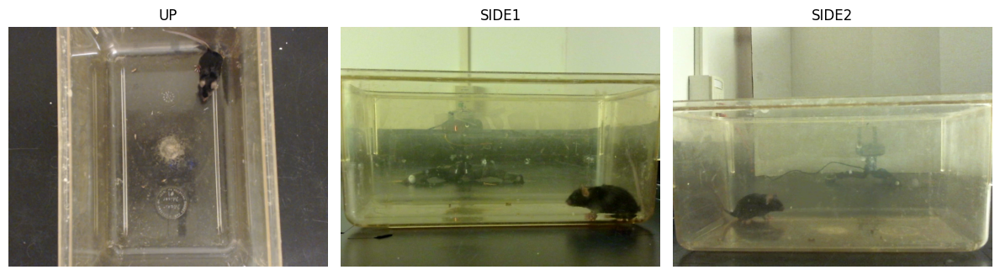

In [69]:
session_dir = "/Volumes/kimlab-11/Epilepsy/112625 15MG+10MG/KA112625 F1/POST KA"

if not os.path.isdir(session_dir):
    raise FileNotFoundError(f"Session directory not found: {session_dir}")

print("Using session_dir:", session_dir)

# View matching rules
views = {
    "UP": "webcamup",
    "SIDE1": "webcamside1",
    "SIDE2": "webcamside2",
}

video_files = {}

# Find matching video files
for fname in os.listdir(session_dir):
    lower = fname.lower()
    full_path = os.path.join(session_dir, fname)

    if not lower.endswith(".mp4"):
        continue

    for v, key in views.items():
        if key in lower:
            video_files[v] = full_path


# Display first frames side-by-side
ordered_views = ["UP", "SIDE1", "SIDE2"]
fig, axes = plt.subplots(1, len(ordered_views), figsize=(12, 4))

for i, v in enumerate(ordered_views):
    if v not in video_files:
        axes[i].set_title(v + " missing")
        axes[i].axis("off")
        continue

    cap = cv2.VideoCapture(video_files[v])
    ok, frame = cap.read()
    cap.release()

    if not ok:
        axes[i].set_title(v + " read error")
        axes[i].axis("off")
        continue

    frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    axes[i].imshow(frame)
    axes[i].set_title(v)
    axes[i].axis("off")

plt.tight_layout()
plt.show()

UP shape after resize: (128, 128)
SIDE1 shape after resize: (128, 128)
SIDE2 shape after resize: (128, 128)


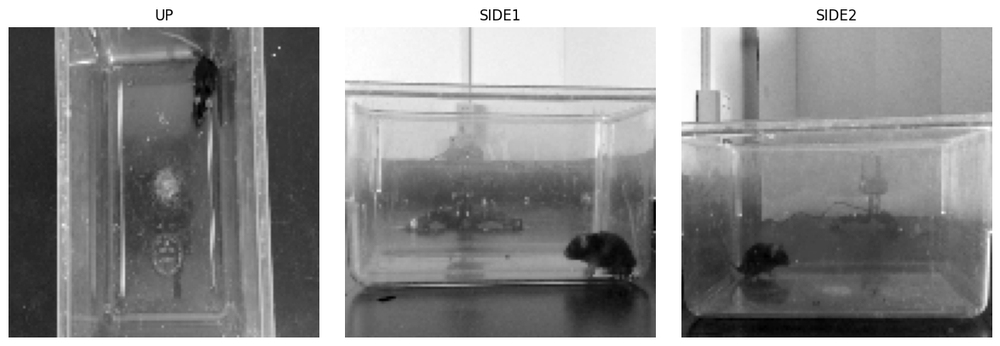

In [70]:
# Show grayscale resized frames side-by-side
ordered_views = ["UP", "SIDE1", "SIDE2"]
fig, axes = plt.subplots(1, len(ordered_views), figsize=(12, 4))

for i, v in enumerate(ordered_views):
    if v not in video_files:
        axes[i].set_title(v + " missing")
        axes[i].axis("off")
        continue

    cap = cv2.VideoCapture(video_files[v])
    ok, frame = cap.read()
    cap.release()

    if not ok:
        axes[i].set_title(v + " read error")
        axes[i].axis("off")
        continue

    # Convert to grayscale
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    # Resize to 128x128
    gray_resized = cv2.resize(gray, resize_shape)

    print(v, "shape after resize:", gray_resized.shape)

    axes[i].imshow(gray_resized, cmap='gray')
    axes[i].set_title(v)
    axes[i].axis("off")

plt.tight_layout()
plt.show()

## Seizure

Stage 2-5: 50:46 - 51:06

In [82]:
video_path = video_files["SIDE1"]
print("Using:", video_path)

# Convert seizure times to milliseconds
start_ms = (50 * 60 + 46) * 1000  
end_ms = (51 * 60 + 6) * 1000    

cap = cv2.VideoCapture(video_path)
fps = cap.get(cv2.CAP_PROP_FPS)
print("Actual FPS detected:", fps)

cap.set(cv2.CAP_PROP_POS_MSEC, start_ms)

frames = []
resize_shape = (128, 128)

while cap.get(cv2.CAP_PROP_POS_MSEC) < end_ms:
    ok, frame = cap.read()
    if not ok:
        break

    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    gray = cv2.resize(gray, resize_shape)
    frames.append(gray)

cap.release()

# Reduce frame count for notebook
frames = frames[::3]  # keep every 3rd frame (~10 fps)
print("Frames used for animation:", len(frames))

fig, ax = plt.subplots(figsize=(4, 4))
ax.axis("off")
im = ax.imshow(frames[0], cmap='gray')
ax.set_title("Seizure clip 50:46 - 51:06 (SIDE1)")

def update(i):
    im.set_data(frames[i])
    return [im]

# Display animation in notebook
ani = FuncAnimation(fig, update, frames=len(frames), interval=100)
plt.close(fig)
HTML(ani.to_jshtml())

Using: /Volumes/kimlab-11/Epilepsy/112625 15MG+10MG/KA112625 F1/POST KA/POST KA112625 F1-webcamside1.mp4
Actual FPS detected: 30.0
Frames used for animation: 201
